In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/air-quality-data-nyc/Air_Quality.csv


# Air Quality Analysis - Jupyter Notebook
### Introduction

This Jupyter Notebook provides an analysis of air quality data using Python. The dataset used for analysis contains information about various air quality indicators, such as ozone and sulfur dioxide levels, measured in different locations and time periods.

The notebook is divided into three code snippets, each focusing on a specific type of analysis:

* Outlier Detection using Box Plots
* Seasonal Analysis: Average Air Quality by Season
* Trend Analysis, Location Comparison, Before and After Comparison, Correlation Analysis, and Threshold Analysis

# Code Snippet 1: Various Analyses on Air Quality Data

This code snippet demonstrates a range of analyses performed on the air quality dataset. It includes the following analyses:

* Trend Analysis: Plots ozone levels over time, showcasing the temporal trend using a line plot.
* Location Comparison: Compares average ozone levels by borough, visualizing the results using a horizontal bar chart.
* Before and After Comparison: Compares ozone levels before and after a specific event, calculating the average ozone levels for each period.
* Correlation Analysis: Investigates the correlation between ozone and sulfur dioxide levels using the data from the corresponding indicators.
* Threshold Analysis: Calculates the percentage of instances where the air quality data value exceeds a specified threshold.

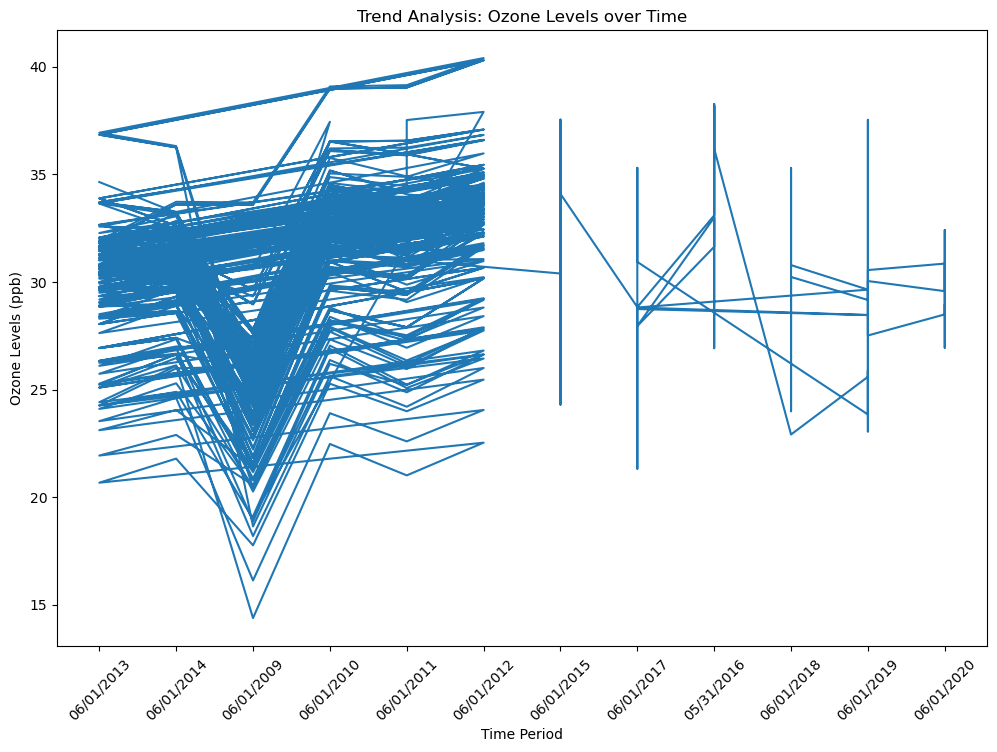

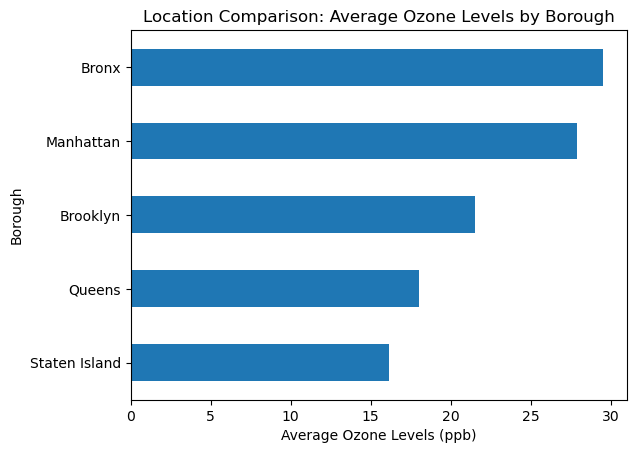

Average Ozone Levels Before the Event: 18.78 ppb
Average Ozone Levels After the Event: 17.936666666666667 ppb
Correlation between Ozone and Sulfur Dioxide: nan
Percentage of Instances Exceeding 40 ppb: 4.931149981391887%


In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('/kaggle/input/air-quality-data-nyc/Air_Quality.csv')

# Increase the figure size
plt.figure(figsize=(12, 8))

# Trend Analysis: Plotting ozone levels over time
ozone_data = data[data['Indicator ID'] == 386]  # Filter ozone data
plt.plot(ozone_data['Start_Date'], ozone_data['Data Value'])
plt.xlabel('Time Period')
plt.ylabel('Ozone Levels (ppb)')
plt.title('Trend Analysis: Ozone Levels over Time')
plt.xticks(rotation=45)
plt.show()

# Location Comparison: Average ozone levels by borough
borough_data = data[data['Geo Type Name'] == 'Borough']  # Filter borough data
avg_ozone_by_borough = borough_data.groupby('Geo Place Name')['Data Value'].mean().sort_values()
avg_ozone_by_borough.plot(kind='barh')
plt.xlabel('Average Ozone Levels (ppb)')
plt.ylabel('Borough')
plt.title('Location Comparison: Average Ozone Levels by Borough')
plt.show()

# Before and After Comparison: Comparing ozone levels before and after a specific event
event_data = data[(data['Geo Place Name'] == 'New York City') & (data['Time Period'].isin(['Summer 2013', 'Summer 2014']))]
before = event_data[event_data['Time Period'] == 'Summer 2013']['Data Value'].mean()
after = event_data[event_data['Time Period'] == 'Summer 2014']['Data Value'].mean()
print(f"Average Ozone Levels Before the Event: {before} ppb")
print(f"Average Ozone Levels After the Event: {after} ppb")

# Correlation Analysis: Correlation between ozone and sulfur dioxide levels
so2_data = data[data['Indicator ID'] == 383]  # Filter sulfur dioxide data
combined_data = ozone_data.merge(so2_data, on=['Geo Join ID', 'Time Period'], suffixes=('_ozone', '_so2'))
correlation = combined_data['Data Value_ozone'].corr(combined_data['Data Value_so2'])
print(f"Correlation between Ozone and Sulfur Dioxide: {correlation}")

# Threshold Analysis: Percentage of instances exceeding a threshold value
threshold = 40  # Example threshold value
exceed_threshold = len(data[data['Data Value'] > threshold]) / len(data) * 100
print(f"Percentage of Instances Exceeding {threshold} ppb: {exceed_threshold}%")


# Code Snippet 2: Seasonal Analysis: Average Air Quality by Season

This code snippet focuses on conducting seasonal analysis of air quality indicators. The code extracts the season information from the "Time Period" column and calculates the average air quality indicators for each season. The results are visualized using a bar chart, showcasing the average air quality indicator values for each season.

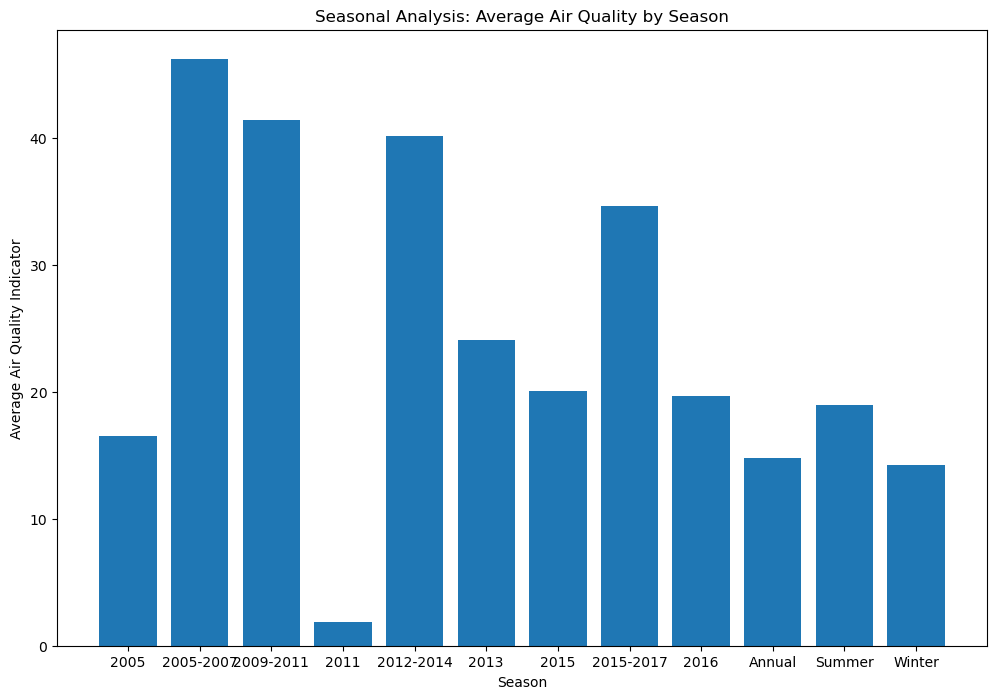

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data 

# Extract the season from the Time Period column
data['Season'] = data['Time Period'].str.split().str[0]

# Calculate the average air quality indicators by season
avg_by_season = data.groupby('Season')['Data Value'].mean()

# Increase the figure size
plt.figure(figsize=(12, 8))

# Plot the average air quality indicators by season
plt.bar(avg_by_season.index, avg_by_season)
plt.xlabel('Season')
plt.ylabel('Average Air Quality Indicator')
plt.title('Seasonal Analysis: Average Air Quality by Season')
plt.show()


# Code Snippet 3: Outlier Detection using Box Plots

In this code snippet, we use the seaborn library to detect outliers in the air quality dataset. The code loads the dataset and creates a box plot to visualize the distribution of data values for different indicator IDs. Outliers can be identified based on their position outside the whiskers of the box plot.

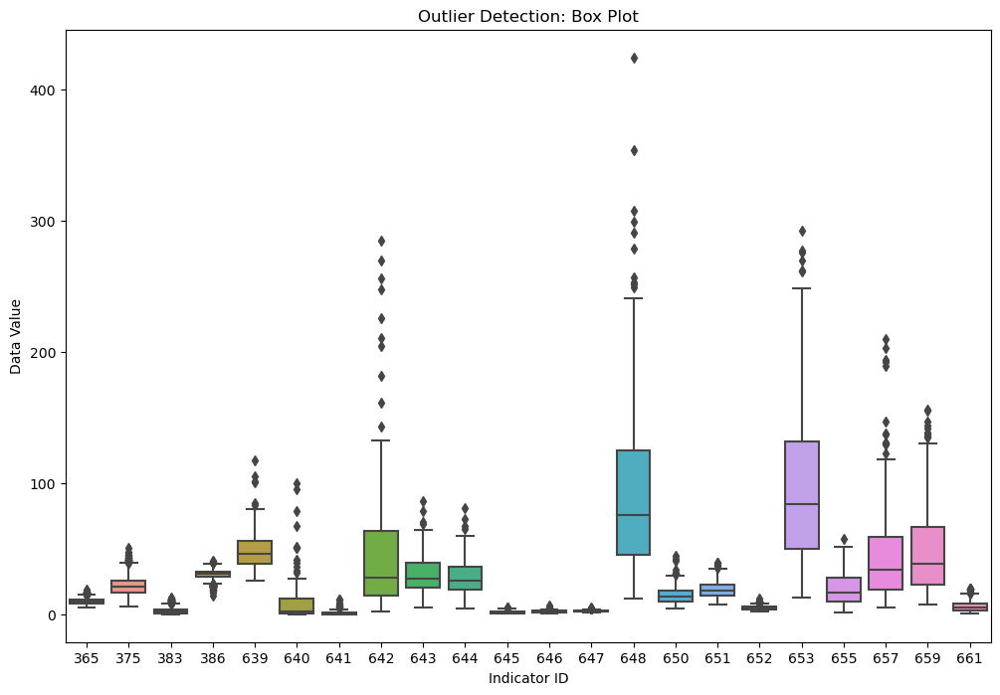

In [4]:
import pandas as pd
import seaborn as sns

# Load the dataset
data 

# Increase the figure size
plt.figure(figsize=(12, 8))

# Detect outliers using box plots
sns.boxplot(x=data['Indicator ID'], y=data['Data Value'])
plt.xlabel('Indicator ID')
plt.ylabel('Data Value')
plt.title('Outlier Detection: Box Plot')
plt.show()


In [5]:
import pandas as pd   # added newly

# Load the dataset
data = pd.read_csv('/kaggle/input/air-quality-data-nyc/Air_Quality.csv')

# Define the AQI breakpoints and corresponding color categories
aqi_breakpoints = [
    (0, 50),
    (51, 100),
    (101, 150)
]

aqi_colors = ['Green', 'Yellow', 'Orange']

# Calculate the AQI and assign color categories
data['AQI'] = pd.cut(data['Data Value'], bins=[x[0] for x in aqi_breakpoints] + [aqi_breakpoints[-1][1]], labels=aqi_colors)

# Display the updated dataset with AQI values
print(data[['Start_Date', 'Data Value', 'AQI']])


       Start_Date  Data Value    AQI
0      06/01/2013       34.64  Green
1      06/01/2014       33.22  Green
2      06/01/2013       31.25  Green
3      06/01/2014       31.15  Green
4      12/01/2008        5.89  Green
...           ...         ...    ...
16117  06/01/2020       28.70  Green
16118  06/01/2020       29.56  Green
16119  06/01/2020       29.65  Green
16120  06/01/2020       29.28  Green
16121  06/01/2020       28.93  Green

[16122 rows x 3 columns]


       Start_Date  Data Value    AQI
0      06/01/2013       34.64  Green
1      06/01/2014       33.22  Green
2      06/01/2013       31.25  Green
3      06/01/2014       31.15  Green
4      12/01/2008        5.89  Green
...           ...         ...    ...
16117  06/01/2020       28.70  Green
16118  06/01/2020       29.56  Green
16119  06/01/2020       29.65  Green
16120  06/01/2020       29.28  Green
16121  06/01/2020       28.93  Green

[16122 rows x 3 columns]


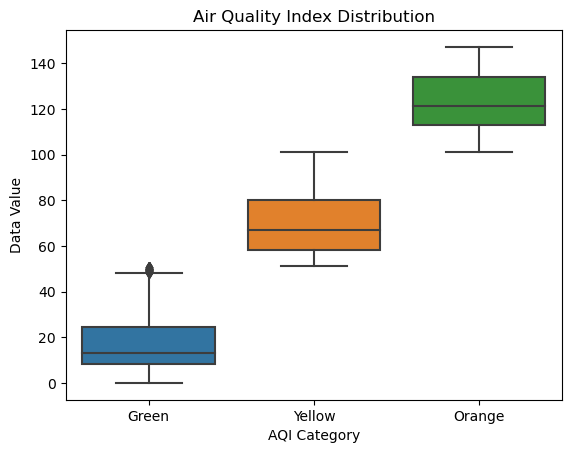

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Display the updated dataset with AQI values
print(data[['Start_Date', 'Data Value', 'AQI']])

# Create a box plot of AQI values
sns.boxplot(x='AQI', y='Data Value', data=data)

# Set the title and labels for the plot
plt.title('Air Quality Index Distribution')
plt.xlabel('AQI Category')
plt.ylabel('Data Value')

# Show the plot
plt.show()


In [7]:
import pandas as pd
from geopy.geocoders import Nominatim

# Load the dataset
data 

# Initialize the geocoder with a custom user agent and timeout
geolocator = Nominatim(user_agent='myapplication', timeout=10)

# Get latitude and longitude for each place
latitudes = []
longitudes = []

for place in data['Geo Place Name']:
    try:
        location = geolocator.geocode(place)
        if location:
            latitudes.append(location.latitude)
            longitudes.append(location.longitude)
        else:
            latitudes.append(None)
            longitudes.append(None)
    except Exception as e:
        print(f"Error geocoding '{place}': {str(e)}")
        latitudes.append(None)
        longitudes.append(None)

# Add the latitude and longitude columns to the dataframe
data['Latitude'] = latitudes
data['Longitude'] = longitudes

# Print the dataframe with Geo Place Name, latitude, and longitude
print(data[['Geo Place Name', 'Latitude', 'Longitude']])


Error geocoding 'East Flatbush - Flatbush': Non-successful status code 502
                               Geo Place Name   Latitude   Longitude
0                         Coney Island (CD13)  54.255752   -5.627950
1                         Coney Island (CD13)  54.255752   -5.627950
2                                       Bronx  40.846651  -73.878594
3                                       Bronx  40.846651  -73.878594
4            Morris Park and Bronxdale (CD11)        NaN         NaN
...                                       ...        ...         ...
16117    Park Slope and Carroll Gardens (CD6)        NaN         NaN
16118   East New York and Starrett City (CD5)        NaN         NaN
16119                          Bushwick (CD4)  14.277589  121.071917
16120                Bedford Stuyvesant (CD3)  40.683436  -73.941249
16121  Fort Greene and Brooklyn Heights (CD2)        NaN         NaN

[16122 rows x 3 columns]


In [8]:
data

,Unique ID,Indicator ID,Name,Measure,Measure Info,Geo Type Name,Geo Join ID,Geo Place Name,Time Period,Start_Date,Data Value,Message,AQI,Latitude,Longitude
0,216498,386,Ozone (O3),Mean,ppb,CD,313,Coney Island (CD13),Summer 2013,06/01/2013,34.64,NaN,Green,54.255752,-5.627950
1,216499,386,Ozone (O3),Mean,ppb,CD,313,Coney Island (CD13),Summer 2014,06/01/2014,33.22,NaN,Green,54.255752,-5.627950
2,219969,386,Ozone (O3),Mean,ppb,Borough,1,Bronx,Summer 2013,06/01/2013,31.25,NaN,Green,40.846651,-73.878594
3,219970,386,Ozone (O3),Mean,ppb,Borough,1,Bronx,Summer 2014,06/01/2014,31.15,NaN,Green,40.846651,-73.878594
4,164876,383,Sulfur Dioxide (SO2),Mean,ppb,CD,211,Morris Park and Bronxdale (CD11),Winter 2008-09,12/01/2008,5.89,NaN,Green,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16117,671118,386,Ozone (O3),Mean,ppb,CD,306,Park Slope and Carroll Gardens (CD6),Summer 2020,06/01/2020,28.70,NaN,Green,NaN,NaN
16118,671119,386,Ozone (O3),Mean,ppb,CD,305,East New York and Starrett City (CD5),Summer 2020,06/01/2020,29.56,NaN,Green,NaN,NaN
16119,671120,386,Ozone (O3),Mean,ppb,CD,304,Bushwick (CD4),Summer 2020,06/01/2020,29.65,NaN,Green,14.277589,121.071917
16120,671121,386,Ozone (O3),Mean,ppb,CD,303,Bedford Stuyvesant (CD3),Summer 2020,06/01/2020,29.28,NaN,Green,40.683436,-73.941249


In [9]:
import pandas as pd
import folium

# Load the dataset
data 

# Create a folium map centered on New York City
map_nyc = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

# Iterate over the rows of the dataframe
for index, row in data.iterrows():
    # Extract the necessary information
    lat = row['Latitude']
    lon = row['Longitude']
    aqi = row['AQI']
    
    # Check if latitude and longitude are not NaN
    if pd.notnull(lat) and pd.notnull(lon):
        # Create a marker for each data point
        folium.Marker(location=[lat, lon], popup=f"AQI: {aqi}").add_to(map_nyc)

# Display the map
map_nyc
